# Imports

In [54]:
try:
    from IPython.core.display import display, HTML

    display(HTML("<style>.container { width:100% !important; }</style>"))
except Exception as e:
    pass

%load_ext memory_profiler
%load_ext jupyter_black
%load_ext line_profiler
%load_ext autoreload
%load_ext autotime
%autosave 300
%autoreload 2

D:\Temp\AppData\Local\Temp\ipykernel_35856\3193644951.py:2: DeprecationWarning:

Importing display from IPython.core.display is deprecated since IPython 7.14, please import from IPython display



The memory_profiler extension is already loaded. To reload it, use:
  %reload_ext memory_profiler
The jupyter_black extension is already loaded. To reload it, use:
  %reload_ext jupyter_black
The line_profiler extension is already loaded. To reload it, use:
  %reload_ext line_profiler
The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
The autotime extension is already loaded. To reload it, use:
  %reload_ext autotime


Autosaving every 300 seconds
time: 16 ms (started: 2025-12-17 10:10:31 +03:00)


In [55]:
from astro_flares import *

import plotly.io as pio

pio.renderers.default = "notebook"  # или "jupyterlab" если JupyterLab

time: 0 ns (started: 2025-12-17 10:10:31 +03:00)


# Data

In [5]:
dataset = load_dataset(
    "snad-space/ztf-m-dwarf-flares-2025",
    cache_dir="D:\.cache\huggingface",
    split="train",
    streaming=True,
)

Resolving data files:   0%|          | 0/314 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/314 [00:00<?, ?it/s]

time: 12.7 s (started: 2025-12-17 04:00:59 +03:00)


In [6]:
df = pl.DataFrame(
    list(dataset.shuffle(buffer_size=1_000, seed=42).take(1_000))
    + list(dataset.take(1_000))
)
df

id,class,mjd,mag,magerr
str,i64,list[f64],list[f64],list[f64]
"""TIC260352702_CADENCE204203_ZTF…",1,"[58720.19607, 58720.19652, … 58720.25877]","[17.02846, 17.021832, … 16.993269]","[0.016799, 0.015893, … 0.013924]"
"""TIC234523931_CADENCE231234_ZTF…",1,"[58673.38164, 58673.38343, … 58673.44182]","[14.419371, 14.43163, … 14.411902]","[0.01076, 0.010346, … 0.013891]"
"""TIC29671923_CADENCE232959_ZTFD…",1,"[58317.2832, 58317.28457, … 58317.33846]","[13.809133, 13.791163, … 13.713088]","[0.01203, 0.010807, … 0.009823]"
"""TIC237883499_CADENCE273312_ZTF…",1,"[58673.23666, 58673.23712, … 58673.29931]","[17.290174, 17.315382, … 17.051571]","[0.024313, 0.026946, … 0.025541]"
"""TIC349762144_CADENCE42267_ZTFD…",1,"[58658.26441, 58658.26486, … 58658.31744]","[18.954103, 18.742413, … 19.376421]","[0.06728, 0.049114, … 0.071265]"
…,…,…,…,…
"""ZTFDR333203100188987_MJD58314.…",0,"[58314.25806, 58314.25851, … 58314.31832]","[17.990116, 17.849888, … 18.083256]","[0.041173, 0.038448, … 0.043182]"
"""ZTFDR334208100155061_MJD58720.…",0,"[58720.19766, 58720.1981, … 58720.26324]","[18.554863, 18.665051, … 18.654888]","[0.057336, 0.061514, … 0.061114]"
"""ZTFDR639210300162741_MJD58337.…",0,"[58337.2135, 58337.21444, … 58337.32468]","[18.00469, 18.098808, … 17.940584]","[0.033585, 0.034957, … 0.032712]"


time: 32.9 s (started: 2025-12-17 04:01:12 +03:00)


In [17]:
df.columns, df.dtypes

(['id', 'class', 'mjd', 'mag', 'magerr'],
 [String, Int64, List(Float64), List(Float64), List(Float64)])

time: 0 ns (started: 2025-12-17 04:06:56 +03:00)


# EDA

In [10]:
df["class"].sum()

1000

time: 15 ms (started: 2025-12-17 04:05:33 +03:00)


In [13]:
norm_series(df, 13)

time: 109 ms (started: 2025-12-17 04:05:56 +03:00)


In [14]:
compare_classes(df)

time: 94 ms (started: 2025-12-17 04:06:01 +03:00)


# ML

In [53]:
features = extract_features_polars(df, normalize="zscore")
features

id,class,npoints,mag_std,mag_skewness,mag_kurtosis,mag_amplitude_sigma,mag_mean,mag_median,magerr_std,magerr_skewness,magerr_kurtosis,magerr_amplitude_sigma,magerr_mean,magerr_median,norm_std,norm_skewness,norm_kurtosis,norm_amplitude_sigma,norm_mean,norm_median
str,i64,u32,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64
"""TIC260352702_CADENCE204203_ZTF…",1,13,1.0,-2.026675,3.157723,3.623423,6.4401e-15,0.355949,1.0,0.248869,-1.759621,2.522304,4.6117e-16,-0.75162,1.0,-2.026675,3.157723,3.623423,-3.1492e-17,0.355949
"""TIC234523931_CADENCE231234_ZTF…",1,39,1.0,-2.873871,8.348576,4.897444,-6.4051e-18,0.228656,1.0,1.487877,1.467528,4.455951,3.4161e-16,-0.461423,1.0,-2.873871,8.348576,4.897444,-5.1597e-17,0.228656
"""TIC29671923_CADENCE232959_ZTFD…",1,31,1.0,-0.746351,0.088196,3.858337,-3.6315e-15,-0.005671,1.0,1.624468,2.407145,4.124187,-2.0772e-16,-0.653288,1.0,-0.746351,0.088196,3.858337,-3.5814e-17,-0.005671
"""TIC237883499_CADENCE273312_ZTF…",1,12,1.0,-1.630231,1.075138,3.045755,-1.2768e-14,0.332284,1.0,0.81465,0.073851,3.663976,4.0246e-16,-0.257961,1.0,-1.630231,1.075138,3.045755,-3.7007e-17,0.332284
"""TIC349762144_CADENCE42267_ZTFD…",1,10,1.0,-0.737556,-0.057765,3.454011,-2.2204e-17,0.235544,1.0,-0.159641,-1.052939,3.003744,3.3307e-16,-0.013913,1.0,-0.737556,-0.057765,3.454011,0.0,0.235544
…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…
"""ZTFDR333203100188987_MJD58314.…",0,128,1.0,0.307123,-1.059739,4.644536,-5.2042e-18,-0.374514,1.0,0.458363,-1.007818,4.549879,-1.6914e-17,-0.418382,1.0,0.307123,-1.059739,4.644536,-8.7604e-17,-0.374514
"""ZTFDR334208100155061_MJD58720.…",0,13,1.0,-0.585438,0.24642,3.900776,-1.3895e-14,0.208417,1.0,-0.331863,0.04618,3.902012,6.3197e-16,0.172384,1.0,-0.585438,0.24642,3.900776,-3.4161e-17,0.208417
"""ZTFDR639210300162741_MJD58337.…",0,117,1.0,0.10381,-0.310728,4.623609,-5.8121e-15,0.010723,1.0,0.286986,-0.219826,4.639523,1.5301e-15,-0.02533,1.0,0.10381,-0.310728,4.623609,-2.3723e-17,0.010723


time: 32 ms (started: 2025-12-17 09:09:35 +03:00)


In [39]:
from mlframe.training.configs import PolarsPipelineConfig, TrainingSplitConfig
from mlframe.training.core import train_mlframe_models_suite
from mlframe.profiling.profile_training import create_synthetic_data
from mlframe.training.extractors import SimpleFeaturesAndTargetsExtractor

time: 0 ns (started: 2025-12-17 04:45:48 +03:00)


In [40]:
ft_extractor = SimpleFeaturesAndTargetsExtractor(
    classification_targets=["class"], columns_to_drop=set(["id"]), verbose=1
)

time: 0 ns (started: 2025-12-17 04:45:49 +03:00)


Raw data:
<class 'polars.dataframe.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Columns: 21 entries, id to norm_median
dtypes: Float64(18), Int64(1), String(1), UInt32(1)
memory usage: 0.0+ GB
Processed data:
<class 'polars.dataframe.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Columns: 21 entries, id to norm_median
dtypes: Float64(18), Int64(1), String(1), UInt32(1)
memory usage: 0.0+ GB


,id,class,npoints,mag_std,mag_skewness,mag_kurtosis,mag_amplitude_sigma,mag_mean,mag_median,magerr_std,magerr_skewness,magerr_kurtosis,magerr_amplitude_sigma,magerr_mean,magerr_median,norm_std,norm_skewness,norm_kurtosis,norm_amplitude_sigma,norm_mean,norm_median
0,TIC260352702_CADENCE204203_ZTFDR284206200034969_OFFSET58720.20666_MJD58380.49886099994,1,13,0.084934,-2.026675,3.157723,0.307751,16.991599,17.021832,0.001140,0.248869,-1.759621,0.002874,0.015111,0.014254,5.958474,-2.026675,3.157723,21.590071,-2.120913,0.000000
1,TIC234523931_CADENCE231234_ZTFDR593202100017709_OFFSET58673.40977_MJD58329.62694799993,1,39,0.033358,-2.873871,8.348576,0.163368,14.407945,14.415572,0.001103,1.487877,1.467528,0.004914,0.011278,0.010770,3.097410,-2.873871,8.348576,15.169390,-0.708243,0.000000
2,TIC29671923_CADENCE232959_ZTFDR384210400051842_OFFSET58317.2937_MJD58345.93374900008,1,31,0.203501,-0.746351,0.088196,0.785174,13.562053,13.560899,0.001541,1.624468,2.407145,0.006355,0.010865,0.009859,20.641997,-0.746351,0.088196,79.643779,0.117066,0.000000
3,TIC237883499_CADENCE273312_ZTFDR537202300020103_OFFSET58673.29931_MJD58361.33458000002,1,12,0.092381,-1.630231,1.075138,0.281370,17.267191,17.297888,0.002913,0.814650,0.073851,0.010674,0.024533,0.023781,3.884605,-1.630231,1.075138,11.831557,-1.290790,0.000000
4,TIC349762144_CADENCE42267_ZTFDR485202100046170_OFFSET58658.26486_MJD58337.968597,1,10,0.183557,-0.737556,-0.057765,0.634008,19.123613,19.166849,0.008168,-0.159641,-1.052939,0.024533,0.059753,0.059639,3.077794,-0.737556,-0.057765,10.630734,-0.724956,0.000000


'binary_classification class'

,proportion
i8,f64
1,0.5
0,0.5


,id,class,npoints,mag_std,mag_skewness,mag_kurtosis,mag_amplitude_sigma,mag_mean,mag_median,magerr_std,...,magerr_kurtosis,magerr_amplitude_sigma,magerr_mean,magerr_median,norm_std,norm_skewness,norm_kurtosis,norm_amplitude_sigma,norm_mean,norm_median
0,TIC260352702_CADENCE204203_ZTFDR28420620003496...,1,13,0.084934,-2.026675,3.157723,0.307751,16.991599,17.021832,0.001140,...,-1.759621,0.002874,0.015111,0.014254,5.958474,-2.026675,3.157723,21.590071,-2.120913,0.0
1,TIC234523931_CADENCE231234_ZTFDR59320210001770...,1,39,0.033358,-2.873871,8.348576,0.163368,14.407945,14.415572,0.001103,...,1.467528,0.004914,0.011278,0.010770,3.097410,-2.873871,8.348576,15.169390,-0.708243,0.0
2,TIC29671923_CADENCE232959_ZTFDR384210400051842...,1,31,0.203501,-0.746351,0.088196,0.785174,13.562053,13.560899,0.001541,...,2.407145,0.006355,0.010865,0.009859,20.641997,-0.746351,0.088196,79.643779,0.117066,0.0
3,TIC237883499_CADENCE273312_ZTFDR53720230002010...,1,12,0.092381,-1.630231,1.075138,0.281370,17.267191,17.297888,0.002913,...,0.073851,0.010674,0.024533,0.023781,3.884605,-1.630231,1.075138,11.831557,-1.290790,0.0
4,TIC349762144_CADENCE42267_ZTFDR485202100046170...,1,10,0.183557,-0.737556,-0.057765,0.634008,19.123613,19.166849,0.008168,...,-1.052939,0.024533,0.059753,0.059639,3.077794,-0.737556,-0.057765,10.630734,-0.724956,0.0


,id,class,npoints,mag_std,mag_skewness,mag_kurtosis,mag_amplitude_sigma,mag_mean,mag_median,magerr_std,...,magerr_kurtosis,magerr_amplitude_sigma,magerr_mean,magerr_median,norm_std,norm_skewness,norm_kurtosis,norm_amplitude_sigma,norm_mean,norm_median
0,ZTFDR333203100188987_MJD58314.25806,0,128,0.141425,0.307123,-1.059739,0.656855,18.008026,17.955060,0.003046,...,-1.007818,0.013861,0.041734,0.040459,3.495486,0.307123,-1.059739,16.234911,1.309107,0.0
1,ZTFDR334208100155061_MJD58720.19766,0,13,0.117700,-0.585438,0.246420,0.459120,18.556040,18.580570,0.004189,...,0.046180,0.016346,0.057558,0.058280,2.019562,-0.585438,0.246420,7.877860,-0.420910,0.0
2,ZTFDR639210300162741_MJD58337.2135,0,117,0.083331,0.103810,-0.310728,0.385292,17.954970,17.955864,0.001124,...,-0.219826,0.005217,0.032944,0.032916,2.531647,0.103810,-0.310728,11.705345,-0.027148,0.0
3,ZTFDR436209300170840_MJD58697.22557,0,13,0.297875,-0.191891,-1.494556,0.874952,20.321243,20.450432,0.021146,...,-1.518999,0.061379,0.139554,0.149136,1.997333,-0.191891,-1.494556,5.866790,-0.866246,0.0
4,ZTFDR464205200003897_MJD58854.26278,0,13,0.115919,-0.949501,0.306568,0.404732,18.563578,18.575821,0.003335,...,0.013743,0.011593,0.041573,0.041787,2.774037,-0.949501,0.306568,9.685566,-0.292981,0.0


target type:   0%|          | 0/1 [00:00<?, ?it/s]

target:   0%|          | 0/1 [00:00<?, ?it/s]

pre_pipeline:   0%|          | 0/1 [00:00<?, ?it/s]

mlframe model:   0%|          | 0/5 [00:00<?, ?it/s]

weighting schema:   0%|          | 0/1 [00:00<?, ?it/s]

D:\ProgramData\anaconda3\Lib\site-packages\catboost\core.py:2321: UserWarning:

Can't optimze method "evaluate" because self argument is used



MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

Default metric period is 5 because PythonUserDefinedPerObject is/are not implemented for GPU


es_best_iter: 26


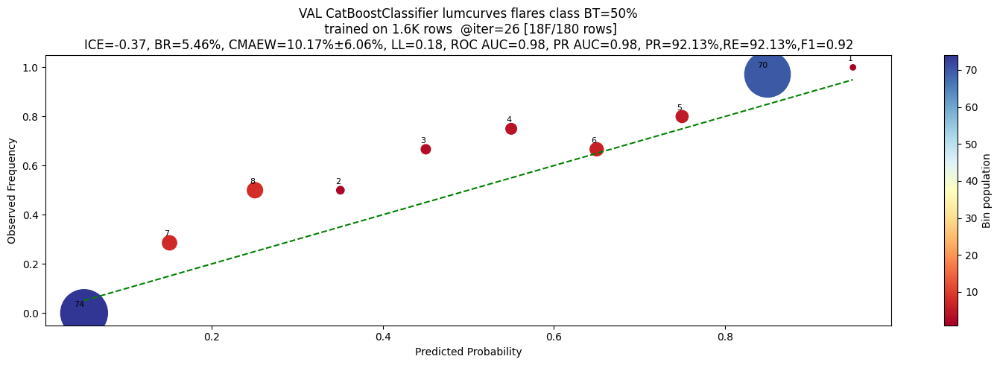

VAL CatBoostClassifier lumcurves flares class BT=50%
 trained on 1.6K rows  @iter=26
              precision    recall  f1-score   support

           0     0.9231    0.9231    0.9231        91
           1     0.9213    0.9213    0.9213        89

    accuracy                         0.9222       180
   macro avg     0.9222    0.9222    0.9222       180
weighted avg     0.9222    0.9222    0.9222       180

ROC AUCs: 1=0.9820
PR AUCs: 1=0.9804
CALIBRATIONs: 
	1: MAEW=10.17%, STD=6.06%, COV=90%
BRIER LOSSes: 
	1=5.4610%
LOG_LOSSes: 
	1=0.1779
ICEs: 
	1=-0.3727
TOTAL INTEGRAL ERROR: -0.3727


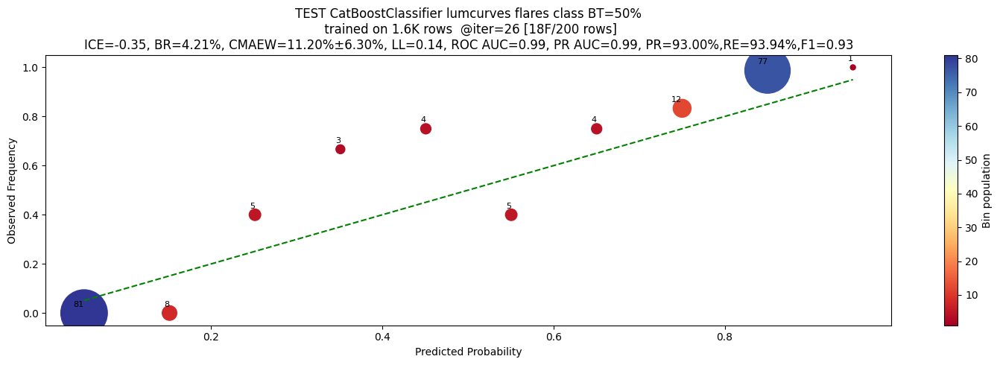

TEST CatBoostClassifier lumcurves flares class BT=50%
 trained on 1.6K rows  @iter=26
              precision    recall  f1-score   support

           0     0.9400    0.9307    0.9353       101
           1     0.9300    0.9394    0.9347        99

    accuracy                         0.9350       200
   macro avg     0.9350    0.9350    0.9350       200
weighted avg     0.9350    0.9350    0.9350       200

ROC AUCs: 1=0.9893
PR AUCs: 1=0.9889
CALIBRATIONs: 
	1: MAEW=11.20%, STD=6.30%, COV=90%
BRIER LOSSes: 
	1=4.2120%
LOG_LOSSes: 
	1=0.1389
ICEs: 
	1=-0.3540
TOTAL INTEGRAL ERROR: -0.3540


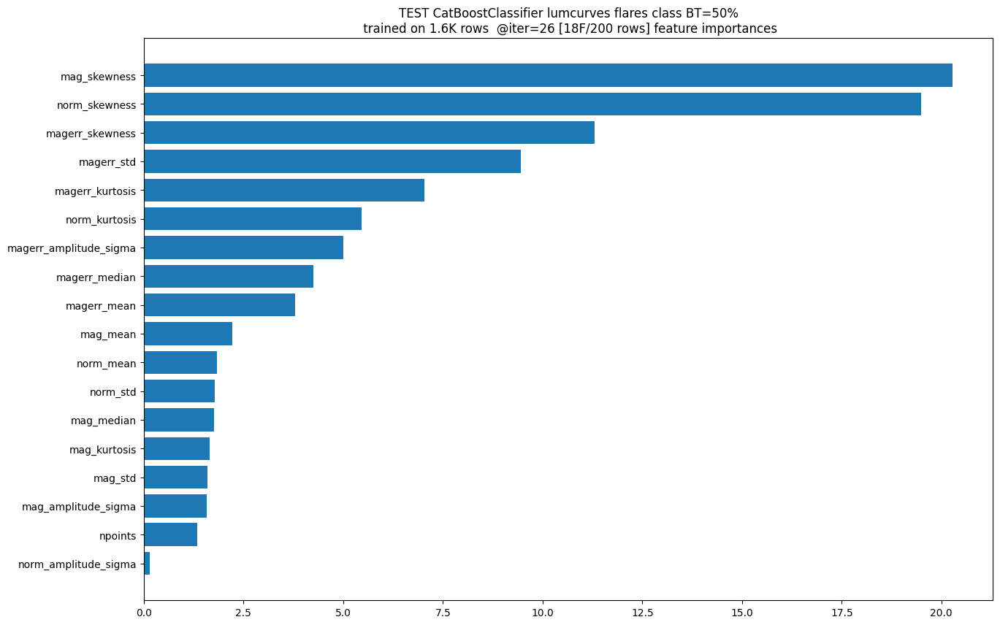

weighting schema:   0%|          | 0/1 [00:00<?, ?it/s]

               verbose=-1) skipped due to error 'pandas dtypes must be int, float or bool'


weighting schema:   0%|          | 0/1 [00:00<?, ?it/s]

es_best_iter: 20


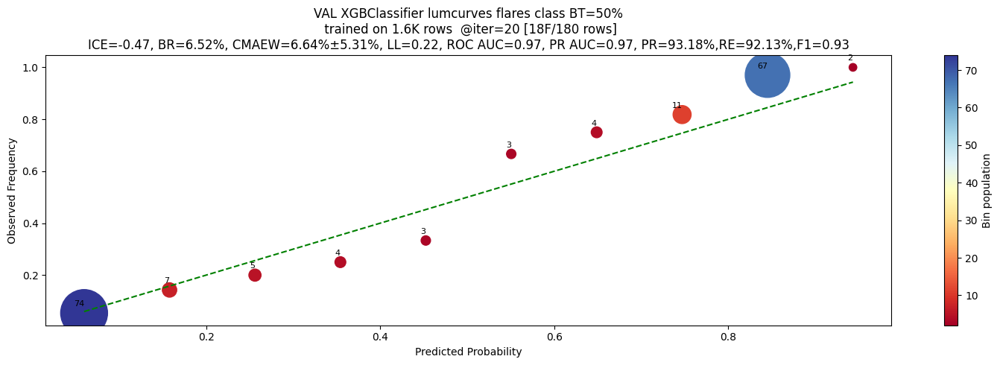

VAL XGBClassifier lumcurves flares class BT=50%
 trained on 1.6K rows  @iter=20
              precision    recall  f1-score   support

           0     0.9239    0.9341    0.9290        91
           1     0.9318    0.9213    0.9266        89

    accuracy                         0.9278       180
   macro avg     0.9279    0.9277    0.9278       180
weighted avg     0.9278    0.9278    0.9278       180

ROC AUCs: 1=0.9718
PR AUCs: 1=0.9745
CALIBRATIONs: 
	1: MAEW=6.64%, STD=5.31%, COV=90%
BRIER LOSSes: 
	1=6.5236%
LOG_LOSSes: 
	1=0.2225
ICEs: 
	1=-0.4737
TOTAL INTEGRAL ERROR: -0.4737


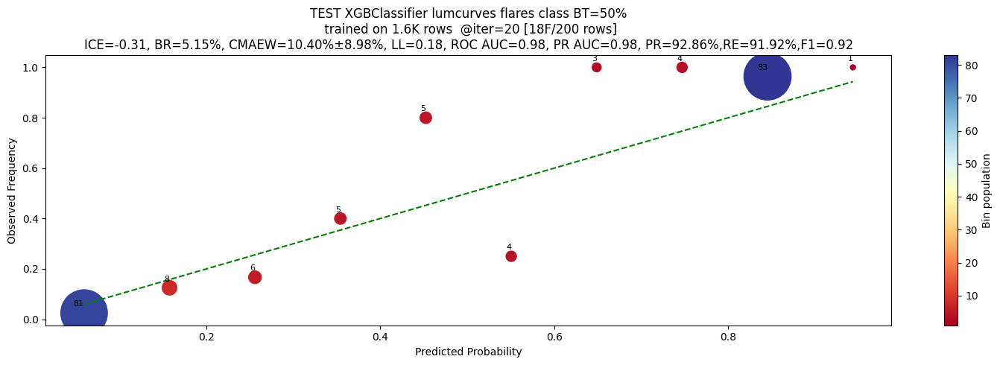

TEST XGBClassifier lumcurves flares class BT=50%
 trained on 1.6K rows  @iter=20
              precision    recall  f1-score   support

           0     0.9216    0.9307    0.9261       101
           1     0.9286    0.9192    0.9239        99

    accuracy                         0.9250       200
   macro avg     0.9251    0.9249    0.9250       200
weighted avg     0.9250    0.9250    0.9250       200

ROC AUCs: 1=0.9819
PR AUCs: 1=0.9830
CALIBRATIONs: 
	1: MAEW=10.40%, STD=8.98%, COV=90%
BRIER LOSSes: 
	1=5.1543%
LOG_LOSSes: 
	1=0.1784
ICEs: 
	1=-0.3091
TOTAL INTEGRAL ERROR: -0.3091


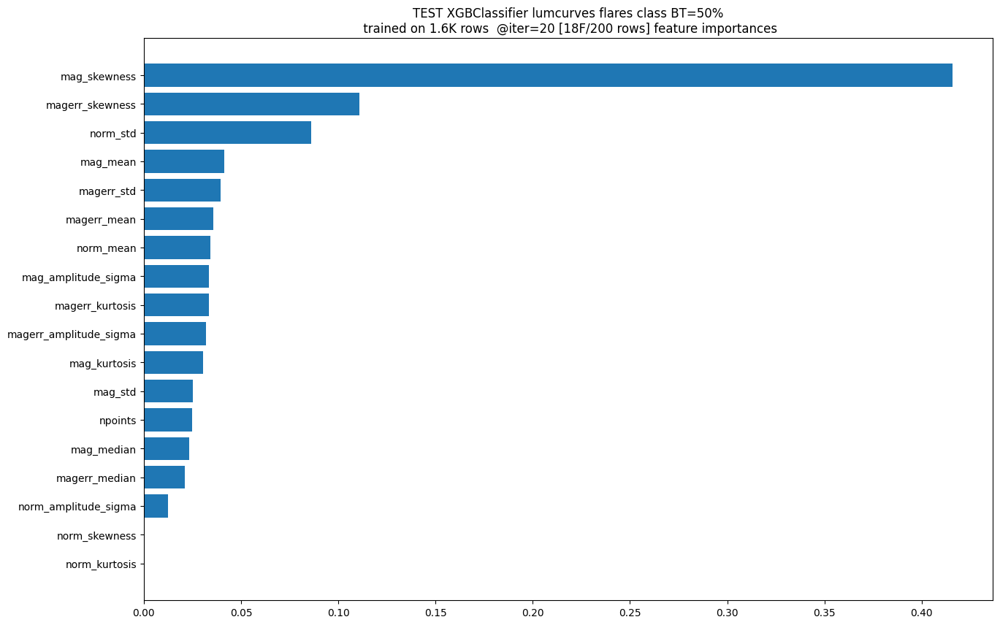

weighting schema:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
D:\ProgramData\anaconda3\Lib\site-packages\lightning\pytorch\callbacks\model_checkpoint.py:751: Checkpoint directory C:\Users\TheLocalCommander\Machine Learning\Astronomy\logs exists and is not empty.
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Sanity Checking: |                                                                            | 0/? [00:00<?, …

D:\ProgramData\anaconda3\Lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:433: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=7` in the `DataLoader` to improve performance.
D:\ProgramData\anaconda3\Lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:433: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=7` in the `DataLoader` to improve performance.
D:\ProgramData\anaconda3\Lib\site-packages\lightning\pytorch\loops\fit_loop.py:310: The number of training batches (2) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Training: |                                                                                   | 0/? [00:00<?, …

Validation: |                                                                                 | 0/? [00:00<?, …

INFO: Metric val_ICE improved. New best score: 0.451
INFO:lightning.pytorch.callbacks.early_stopping:Metric val_ICE improved. New best score: 0.451


Validation: |                                                                                 | 0/? [00:00<?, …

Validation: |                                                                                 | 0/? [00:00<?, …

Validation: |                                                                                 | 0/? [00:00<?, …

INFO: Metric val_ICE improved by 0.257 >= min_delta = 0.001. New best score: 0.194
INFO:lightning.pytorch.callbacks.early_stopping:Metric val_ICE improved by 0.257 >= min_delta = 0.001. New best score: 0.194


Validation: |                                                                                 | 0/? [00:00<?, …

Validation: |                                                                                 | 0/? [00:00<?, …

INFO: Metric val_ICE improved by 0.027 >= min_delta = 0.001. New best score: 0.168
INFO:lightning.pytorch.callbacks.early_stopping:Metric val_ICE improved by 0.027 >= min_delta = 0.001. New best score: 0.168


Validation: |                                                                                 | 0/? [00:00<?, …

INFO: Metric val_ICE improved by 0.055 >= min_delta = 0.001. New best score: 0.113
INFO:lightning.pytorch.callbacks.early_stopping:Metric val_ICE improved by 0.055 >= min_delta = 0.001. New best score: 0.113


Validation: |                                                                                 | 0/? [00:00<?, …

Validation: |                                                                                 | 0/? [00:00<?, …

Validation: |                                                                                 | 0/? [00:00<?, …

Validation: |                                                                                 | 0/? [00:00<?, …

Validation: |                                                                                 | 0/? [00:00<?, …

Validation: |                                                                                 | 0/? [00:00<?, …

Validation: |                                                                                 | 0/? [00:00<?, …

Validation: |                                                                                 | 0/? [00:00<?, …

Validation: |                                                                                 | 0/? [00:00<?, …

Validation: |                                                                                 | 0/? [00:00<?, …

Validation: |                                                                                 | 0/? [00:00<?, …

Validation: |                                                                                 | 0/? [00:00<?, …

INFO: Metric val_ICE improved by 0.013 >= min_delta = 0.001. New best score: 0.100
INFO:lightning.pytorch.callbacks.early_stopping:Metric val_ICE improved by 0.013 >= min_delta = 0.001. New best score: 0.100


Validation: |                                                                                 | 0/? [00:00<?, …

Validation: |                                                                                 | 0/? [00:00<?, …

Validation: |                                                                                 | 0/? [00:00<?, …

Validation: |                                                                                 | 0/? [00:00<?, …

INFO: Metric val_ICE improved by 0.018 >= min_delta = 0.001. New best score: 0.082
INFO:lightning.pytorch.callbacks.early_stopping:Metric val_ICE improved by 0.018 >= min_delta = 0.001. New best score: 0.082


Validation: |                                                                                 | 0/? [00:00<?, …

INFO: Metric val_ICE improved by 0.004 >= min_delta = 0.001. New best score: 0.078
INFO:lightning.pytorch.callbacks.early_stopping:Metric val_ICE improved by 0.004 >= min_delta = 0.001. New best score: 0.078


Validation: |                                                                                 | 0/? [00:00<?, …

Validation: |                                                                                 | 0/? [00:00<?, …

INFO: Metric val_ICE improved by 0.031 >= min_delta = 0.001. New best score: 0.047
INFO:lightning.pytorch.callbacks.early_stopping:Metric val_ICE improved by 0.031 >= min_delta = 0.001. New best score: 0.047


Validation: |                                                                                 | 0/? [00:00<?, …

Validation: |                                                                                 | 0/? [00:00<?, …

Validation: |                                                                                 | 0/? [00:00<?, …

Validation: |                                                                                 | 0/? [00:00<?, …

Validation: |                                                                                 | 0/? [00:00<?, …

Validation: |                                                                                 | 0/? [00:00<?, …

Validation: |                                                                                 | 0/? [00:00<?, …

Validation: |                                                                                 | 0/? [00:00<?, …

Validation: |                                                                                 | 0/? [00:00<?, …

Validation: |                                                                                 | 0/? [00:00<?, …

Validation: |                                                                                 | 0/? [00:00<?, …

Validation: |                                                                                 | 0/? [00:00<?, …

Validation: |                                                                                 | 0/? [00:00<?, …

Validation: |                                                                                 | 0/? [00:00<?, …

Validation: |                                                                                 | 0/? [00:00<?, …

Validation: |                                                                                 | 0/? [00:00<?, …

Validation: |                                                                                 | 0/? [00:00<?, …

Validation: |                                                                                 | 0/? [00:00<?, …

Validation: |                                                                                 | 0/? [00:00<?, …

Validation: |                                                                                 | 0/? [00:00<?, …

Validation: |                                                                                 | 0/? [00:00<?, …

Validation: |                                                                                 | 0/? [00:00<?, …

Validation: |                                                                                 | 0/? [00:00<?, …

Validation: |                                                                                 | 0/? [00:00<?, …

Validation: |                                                                                 | 0/? [00:00<?, …

Validation: |                                                                                 | 0/? [00:00<?, …

Validation: |                                                                                 | 0/? [00:00<?, …

Validation: |                                                                                 | 0/? [00:00<?, …

Validation: |                                                                                 | 0/? [00:00<?, …

Validation: |                                                                                 | 0/? [00:00<?, …

Validation: |                                                                                 | 0/? [00:00<?, …

Validation: |                                                                                 | 0/? [00:00<?, …

Validation: |                                                                                 | 0/? [00:00<?, …

Validation: |                                                                                 | 0/? [00:00<?, …

Validation: |                                                                                 | 0/? [00:00<?, …

Validation: |                                                                                 | 0/? [00:00<?, …

Validation: |                                                                                 | 0/? [00:00<?, …

Validation: |                                                                                 | 0/? [00:00<?, …

Validation: |                                                                                 | 0/? [00:00<?, …

Validation: |                                                                                 | 0/? [00:00<?, …

Validation: |                                                                                 | 0/? [00:00<?, …

Validation: |                                                                                 | 0/? [00:00<?, …

Validation: |                                                                                 | 0/? [00:00<?, …

Validation: |                                                                                 | 0/? [00:00<?, …

Validation: |                                                                                 | 0/? [00:00<?, …

Validation: |                                                                                 | 0/? [00:00<?, …

Validation: |                                                                                 | 0/? [00:00<?, …

Validation: |                                                                                 | 0/? [00:00<?, …

Validation: |                                                                                 | 0/? [00:00<?, …

Validation: |                                                                                 | 0/? [00:00<?, …

Validation: |                                                                                 | 0/? [00:00<?, …

Validation: |                                                                                 | 0/? [00:00<?, …

Validation: |                                                                                 | 0/? [00:00<?, …

Validation: |                                                                                 | 0/? [00:00<?, …

Validation: |                                                                                 | 0/? [00:00<?, …

Validation: |                                                                                 | 0/? [00:00<?, …

Validation: |                                                                                 | 0/? [00:00<?, …

Validation: |                                                                                 | 0/? [00:00<?, …

Validation: |                                                                                 | 0/? [00:00<?, …

Validation: |                                                                                 | 0/? [00:00<?, …

Validation: |                                                                                 | 0/? [00:00<?, …

Validation: |                                                                                 | 0/? [00:00<?, …

Validation: |                                                                                 | 0/? [00:00<?, …

Validation: |                                                                                 | 0/? [00:00<?, …

Validation: |                                                                                 | 0/? [00:00<?, …

Validation: |                                                                                 | 0/? [00:00<?, …

Validation: |                                                                                 | 0/? [00:00<?, …

Validation: |                                                                                 | 0/? [00:00<?, …

Validation: |                                                                                 | 0/? [00:00<?, …

Validation: |                                                                                 | 0/? [00:00<?, …

Validation: |                                                                                 | 0/? [00:00<?, …

Validation: |                                                                                 | 0/? [00:00<?, …

Validation: |                                                                                 | 0/? [00:00<?, …

Validation: |                                                                                 | 0/? [00:00<?, …

Validation: |                                                                                 | 0/? [00:00<?, …

Validation: |                                                                                 | 0/? [00:00<?, …

Validation: |                                                                                 | 0/? [00:00<?, …

Validation: |                                                                                 | 0/? [00:00<?, …

Validation: |                                                                                 | 0/? [00:00<?, …

Validation: |                                                                                 | 0/? [00:00<?, …

Validation: |                                                                                 | 0/? [00:00<?, …

Validation: |                                                                                 | 0/? [00:00<?, …

Validation: |                                                                                 | 0/? [00:00<?, …

Validation: |                                                                                 | 0/? [00:00<?, …

Validation: |                                                                                 | 0/? [00:00<?, …

Validation: |                                                                                 | 0/? [00:00<?, …

Validation: |                                                                                 | 0/? [00:00<?, …

Validation: |                                                                                 | 0/? [00:00<?, …

Validation: |                                                                                 | 0/? [00:00<?, …

Validation: |                                                                                 | 0/? [00:00<?, …

Validation: |                                                                                 | 0/? [00:00<?, …

Validation: |                                                                                 | 0/? [00:00<?, …

Validation: |                                                                                 | 0/? [00:00<?, …

Validation: |                                                                                 | 0/? [00:00<?, …

Validation: |                                                                                 | 0/? [00:00<?, …

Validation: |                                                                                 | 0/? [00:00<?, …

Validation: |                                                                                 | 0/? [00:00<?, …

Validation: |                                                                                 | 0/? [00:00<?, …

Validation: |                                                                                 | 0/? [00:00<?, …

Validation: |                                                                                 | 0/? [00:00<?, …

INFO: Monitored metric val_ICE did not improve in the last 100 records. Best score: 0.047. Signaling Trainer to stop.
INFO:lightning.pytorch.callbacks.early_stopping:Monitored metric val_ICE did not improve in the last 100 records. Best score: 0.047. Signaling Trainer to stop.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True


es_best_iter: 25


INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
D:\ProgramData\anaconda3\Lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:433: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=7` in the `DataLoader` to improve performance.


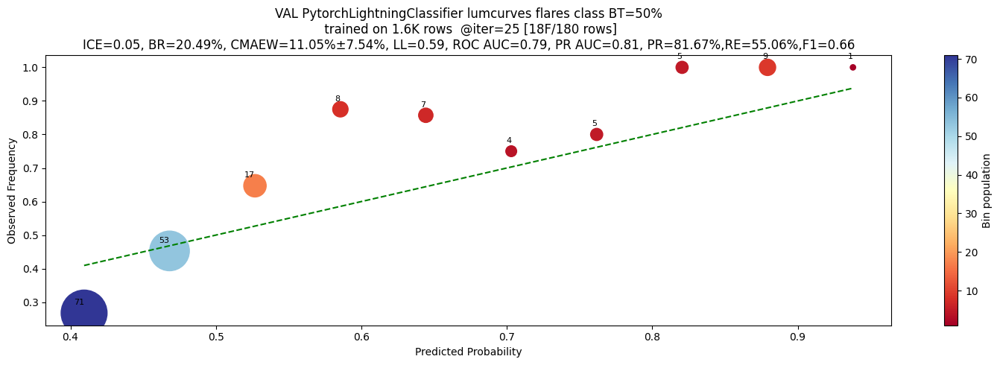

VAL PytorchLightningClassifier lumcurves flares class BT=50%
 trained on 1.6K rows  @iter=25
              precision    recall  f1-score   support

           0     0.6667    0.8791    0.7583        91
           1     0.8167    0.5506    0.6577        89

    accuracy                         0.7167       180
   macro avg     0.7417    0.7148    0.7080       180
weighted avg     0.7408    0.7167    0.7086       180

ROC AUCs: 1=0.7907
PR AUCs: 1=0.8096
CALIBRATIONs: 
	1: MAEW=11.05%, STD=7.54%, COV=60%
BRIER LOSSes: 
	1=20.4929%
LOG_LOSSes: 
	1=0.5920
ICEs: 
	1=0.0472
TOTAL INTEGRAL ERROR: 0.0472


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
D:\ProgramData\anaconda3\Lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:433: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=7` in the `DataLoader` to improve performance.


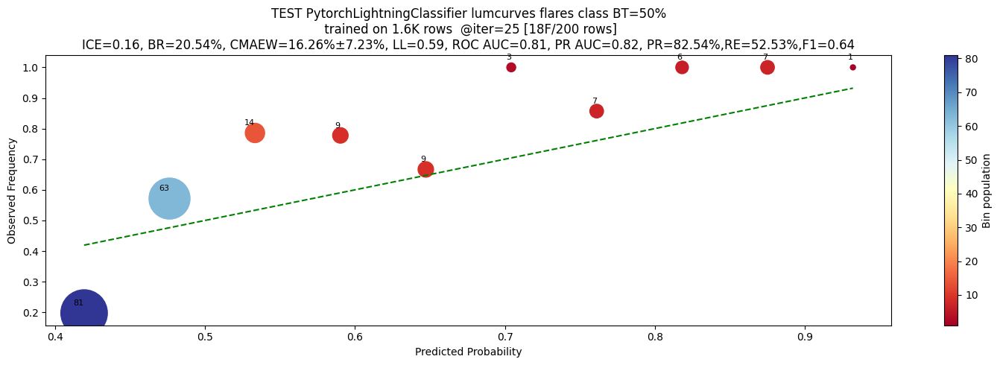

TEST PytorchLightningClassifier lumcurves flares class BT=50%
 trained on 1.6K rows  @iter=25
              precision    recall  f1-score   support

           0     0.6569    0.8911    0.7563       101
           1     0.8254    0.5253    0.6420        99

    accuracy                         0.7100       200
   macro avg     0.7412    0.7082    0.6991       200
weighted avg     0.7403    0.7100    0.6997       200

ROC AUCs: 1=0.8126
PR AUCs: 1=0.8248
CALIBRATIONs: 
	1: MAEW=16.26%, STD=7.23%, COV=60%
BRIER LOSSes: 
	1=20.5363%
LOG_LOSSes: 
	1=0.5940
ICEs: 
	1=0.1633
TOTAL INTEGRAL ERROR: 0.1633


weighting schema:   0%|          | 0/1 [00:00<?, ?it/s]

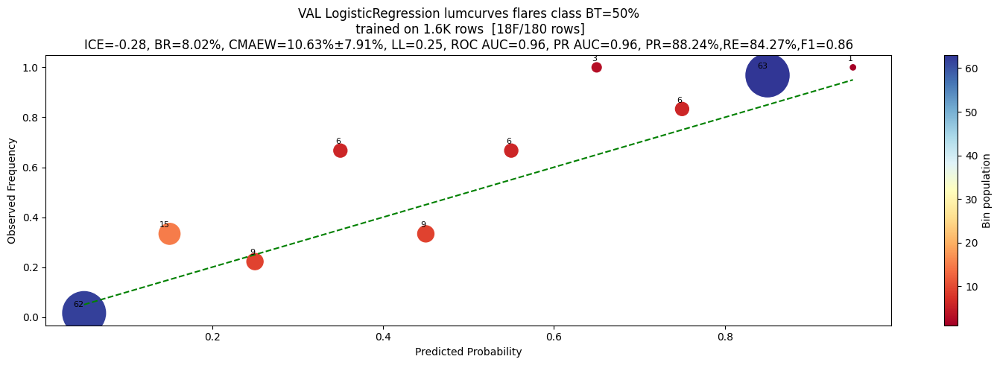

VAL LogisticRegression lumcurves flares class BT=50%
 trained on 1.6K rows 
              precision    recall  f1-score   support

           0     0.8526    0.8901    0.8710        91
           1     0.8824    0.8427    0.8621        89

    accuracy                         0.8667       180
   macro avg     0.8675    0.8664    0.8665       180
weighted avg     0.8673    0.8667    0.8666       180

ROC AUCs: 1=0.9616
PR AUCs: 1=0.9626
CALIBRATIONs: 
	1: MAEW=10.63%, STD=7.91%, COV=90%
BRIER LOSSes: 
	1=8.0197%
LOG_LOSSes: 
	1=0.2533
ICEs: 
	1=-0.2796
TOTAL INTEGRAL ERROR: -0.2796


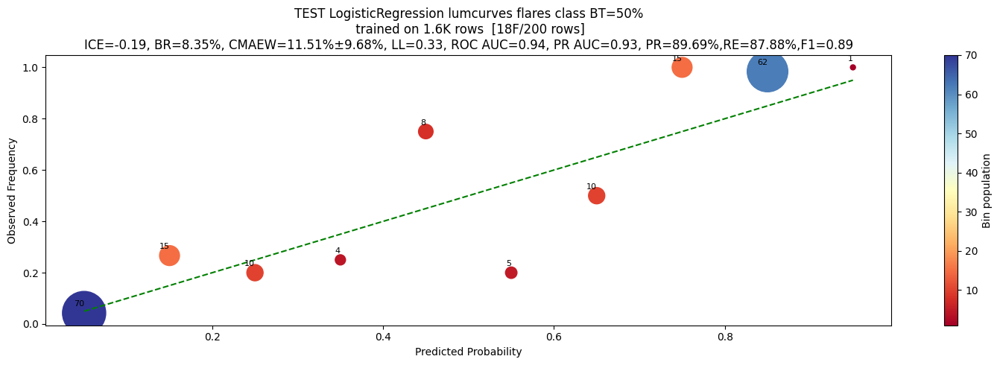

TEST LogisticRegression lumcurves flares class BT=50%
 trained on 1.6K rows 
              precision    recall  f1-score   support

           0     0.8835    0.9010    0.8922       101
           1     0.8969    0.8788    0.8878        99

    accuracy                         0.8900       200
   macro avg     0.8902    0.8899    0.8900       200
weighted avg     0.8901    0.8900    0.8900       200

ROC AUCs: 1=0.9433
PR AUCs: 1=0.9282
CALIBRATIONs: 
	1: MAEW=11.51%, STD=9.68%, COV=90%
BRIER LOSSes: 
	1=8.3489%
LOG_LOSSes: 
	1=0.3253
ICEs: 
	1=-0.1857
TOTAL INTEGRAL ERROR: -0.1857


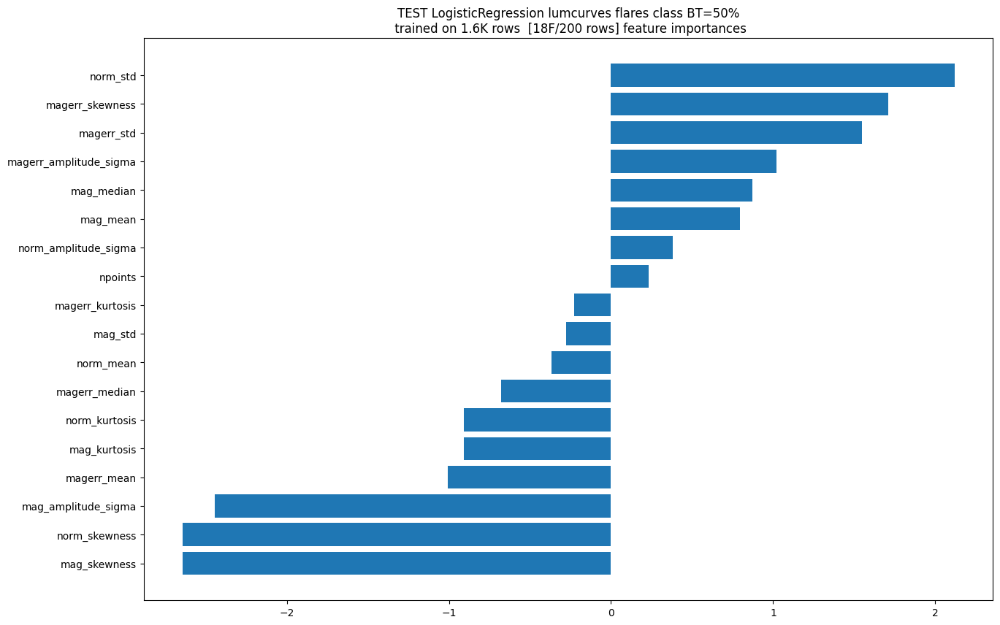

ens member 0 excluded due to high distance from the median, mae=0.045105, std=0.063472
ens member 1 excluded due to high distance from the median, mae=0.044387, std=0.070961
ens member 2 excluded due to high distance from the median, mae=0.316449, std=0.153662
ens member 3 excluded due to high distance from the median, mae=0.045272, std=0.081298
ensemble_probabilistic_predictions filters too restrictive (4 vs 4), skipping them
ens member 0 excluded due to high distance from the median, mae=0.060262, std=0.079726
ens member 1 excluded due to high distance from the median, mae=0.052802, std=0.073278
ens member 2 excluded due to high distance from the median, mae=0.314081, std=0.150232
ens member 3 excluded due to high distance from the median, mae=0.065174, std=0.114138
ensemble_probabilistic_predictions filters too restrictive (4 vs 4), skipping them


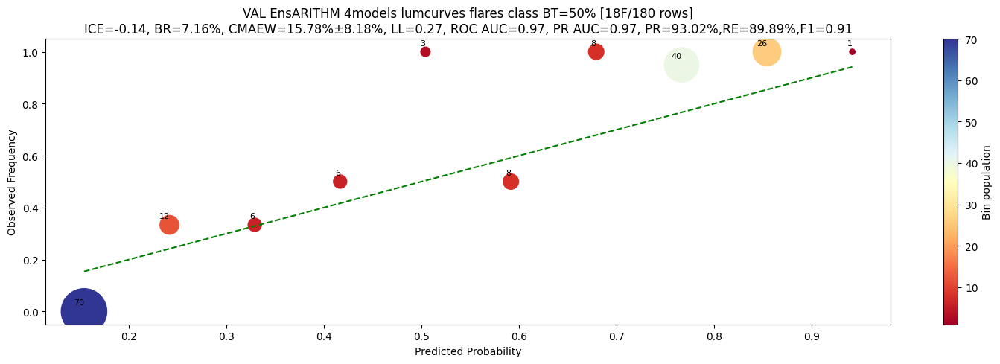

VAL EnsARITHM 4models lumcurves flares class BT=50%
              precision    recall  f1-score   support

           0     0.9043    0.9341    0.9189        91
           1     0.9302    0.8989    0.9143        89

    accuracy                         0.9167       180
   macro avg     0.9172    0.9165    0.9166       180
weighted avg     0.9171    0.9167    0.9166       180

ROC AUCs: 1=0.9718
PR AUCs: 1=0.9663
CALIBRATIONs: 
	1: MAEW=15.78%, STD=8.18%, COV=80%
BRIER LOSSes: 
	1=7.1597%
LOG_LOSSes: 
	1=0.2700
ICEs: 
	1=-0.1389
TOTAL INTEGRAL ERROR: -0.1389


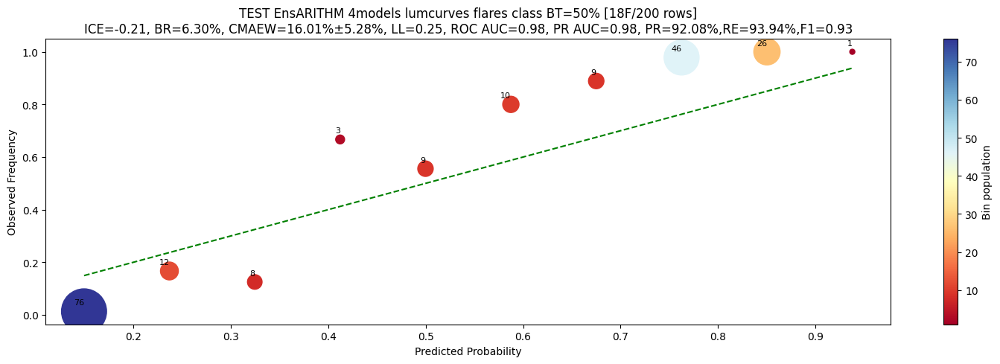

TEST EnsARITHM 4models lumcurves flares class BT=50%
              precision    recall  f1-score   support

           0     0.9394    0.9208    0.9300       101
           1     0.9208    0.9394    0.9300        99

    accuracy                         0.9300       200
   macro avg     0.9301    0.9301    0.9300       200
weighted avg     0.9302    0.9300    0.9300       200

ROC AUCs: 1=0.9845
PR AUCs: 1=0.9842
CALIBRATIONs: 
	1: MAEW=16.01%, STD=5.28%, COV=90%
BRIER LOSSes: 
	1=6.3030%
LOG_LOSSes: 
	1=0.2506
ICEs: 
	1=-0.2140
TOTAL INTEGRAL ERROR: -0.2140


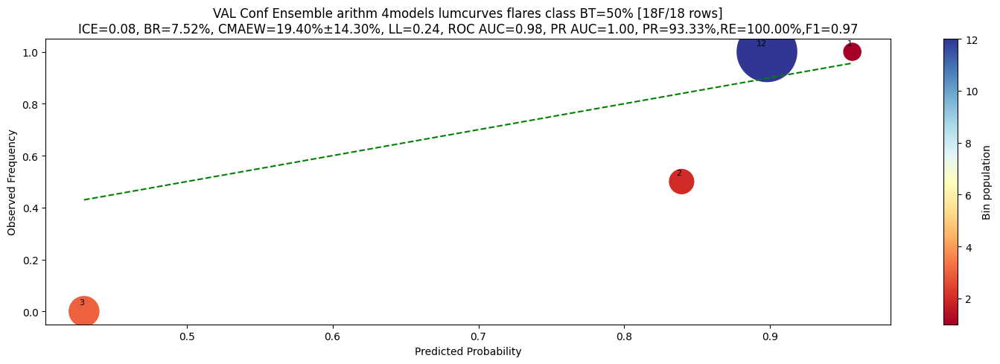

VAL Conf Ensemble arithm 4models lumcurves flares class BT=50%
              precision    recall  f1-score   support

           0     1.0000    0.7500    0.8571         4
           1     0.9333    1.0000    0.9655        14

    accuracy                         0.9444        18
   macro avg     0.9667    0.8750    0.9113        18
weighted avg     0.9481    0.9444    0.9414        18

ROC AUCs: 1=0.9821
PR AUCs: 1=0.9952
CALIBRATIONs: 
	1: MAEW=19.40%, STD=14.30%, COV=40%
BRIER LOSSes: 
	1=7.5191%
LOG_LOSSes: 
	1=0.2364
ICEs: 
	1=0.0753
TOTAL INTEGRAL ERROR: 0.0753


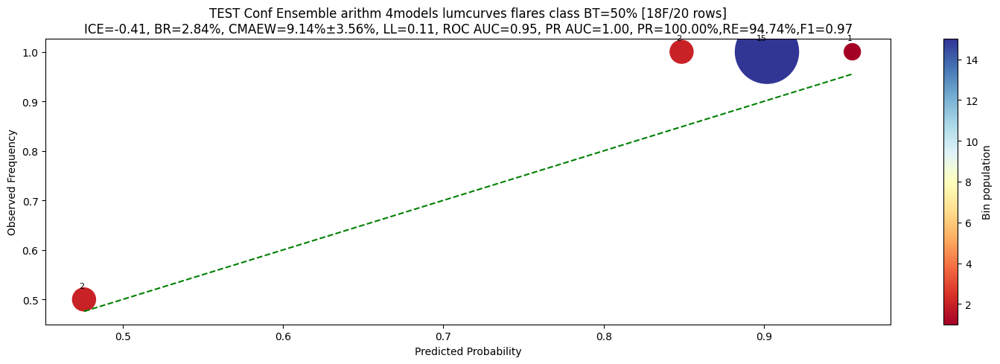

TEST Conf Ensemble arithm 4models lumcurves flares class BT=50%
              precision    recall  f1-score   support

           0     0.5000    1.0000    0.6667         1
           1     1.0000    0.9474    0.9730        19

    accuracy                         0.9500        20
   macro avg     0.7500    0.9737    0.8198        20
weighted avg     0.9750    0.9500    0.9577        20

ROC AUCs: 1=0.9474
PR AUCs: 1=0.9974
CALIBRATIONs: 
	1: MAEW=9.14%, STD=3.56%, COV=40%
BRIER LOSSes: 
	1=2.8418%
LOG_LOSSes: 
	1=0.1146
ICEs: 
	1=-0.4142
TOTAL INTEGRAL ERROR: -0.4142
ens member 0 excluded due to high distance from the median, mae=0.045105, std=0.063472
ens member 1 excluded due to high distance from the median, mae=0.044387, std=0.070961
ens member 2 excluded due to high distance from the median, mae=0.316449, std=0.153662
ens member 3 excluded due to high distance from the median, mae=0.045272, std=0.081298
ensemble_probabilistic_predictions filters too restrictive (4 vs 4), skipping

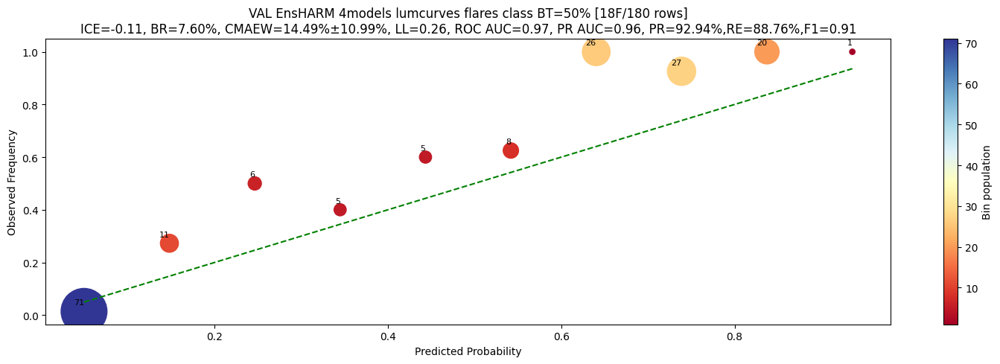

VAL EnsHARM 4models lumcurves flares class BT=50%
              precision    recall  f1-score   support

           0     0.9043    0.9341    0.9189        91
           1     0.9302    0.8989    0.9143        89

    accuracy                         0.9167       180
   macro avg     0.9172    0.9165    0.9166       180
weighted avg     0.9171    0.9167    0.9166       180

ROC AUCs: 1=0.9679
PR AUCs: 1=0.9579
CALIBRATIONs: 
	1: MAEW=14.49%, STD=10.99%, COV=100%
BRIER LOSSes: 
	1=7.5967%
LOG_LOSSes: 
	1=0.2596
ICEs: 
	1=-0.1127
TOTAL INTEGRAL ERROR: -0.1127


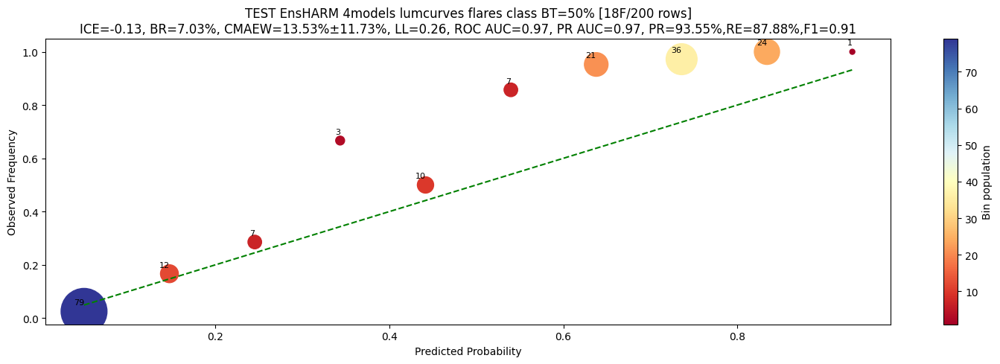

TEST EnsHARM 4models lumcurves flares class BT=50%
              precision    recall  f1-score   support

           0     0.9394    0.9208    0.9300       101
           1     0.9208    0.9394    0.9300        99

    accuracy                         0.9300       200
   macro avg     0.9301    0.9301    0.9300       200
weighted avg     0.9302    0.9300    0.9300       200

ROC AUCs: 1=0.9694
PR AUCs: 1=0.9730
CALIBRATIONs: 
	1: MAEW=13.53%, STD=11.73%, COV=100%
BRIER LOSSes: 
	1=7.0348%
LOG_LOSSes: 
	1=0.2607
ICEs: 
	1=-0.1326
TOTAL INTEGRAL ERROR: -0.1326


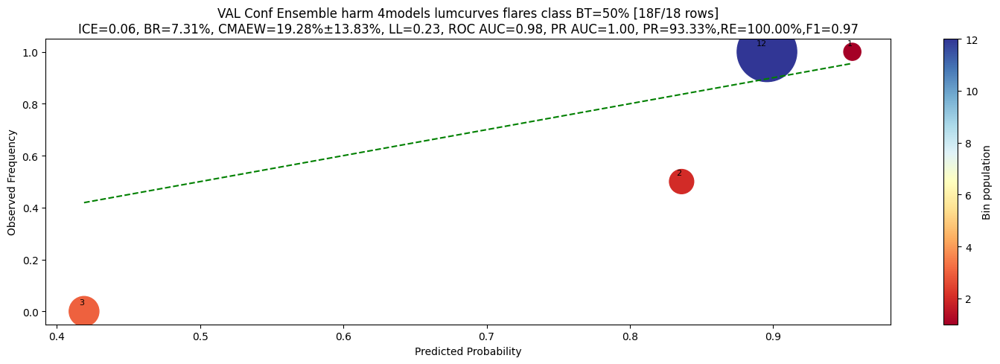

VAL Conf Ensemble harm 4models lumcurves flares class BT=50%
              precision    recall  f1-score   support

           0     1.0000    0.7500    0.8571         4
           1     0.9333    1.0000    0.9655        14

    accuracy                         0.9444        18
   macro avg     0.9667    0.8750    0.9113        18
weighted avg     0.9481    0.9444    0.9414        18

ROC AUCs: 1=0.9821
PR AUCs: 1=0.9952
CALIBRATIONs: 
	1: MAEW=19.28%, STD=13.83%, COV=40%
BRIER LOSSes: 
	1=7.3110%
LOG_LOSSes: 
	1=0.2318
ICEs: 
	1=0.0614
TOTAL INTEGRAL ERROR: 0.0614


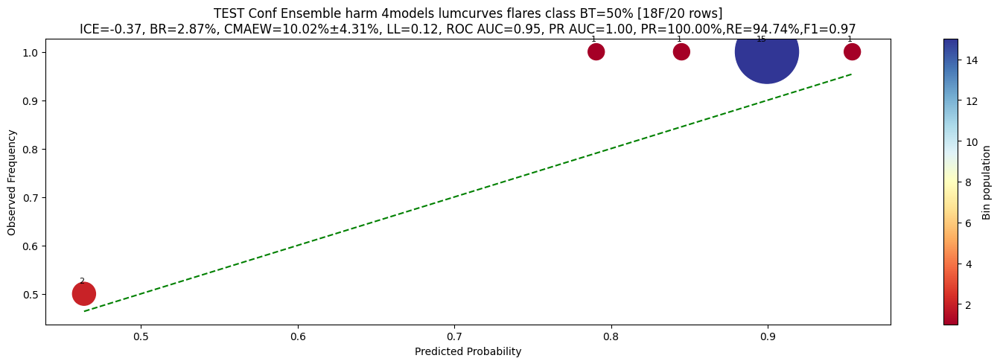

TEST Conf Ensemble harm 4models lumcurves flares class BT=50%
              precision    recall  f1-score   support

           0     0.5000    1.0000    0.6667         1
           1     1.0000    0.9474    0.9730        19

    accuracy                         0.9500        20
   macro avg     0.7500    0.9737    0.8198        20
weighted avg     0.9750    0.9500    0.9577        20

ROC AUCs: 1=0.9474
PR AUCs: 1=0.9974
CALIBRATIONs: 
	1: MAEW=10.02%, STD=4.31%, COV=40%
BRIER LOSSes: 
	1=2.8695%
LOG_LOSSes: 
	1=0.1172
ICEs: 
	1=-0.3725
TOTAL INTEGRAL ERROR: -0.3725
ens member 0 excluded due to high distance from the median, mae=0.045105, std=0.063472
ens member 1 excluded due to high distance from the median, mae=0.044387, std=0.070961
ens member 2 excluded due to high distance from the median, mae=0.316449, std=0.153662
ens member 3 excluded due to high distance from the median, mae=0.045272, std=0.081298
ensemble_probabilistic_predictions filters too restrictive (4 vs 4), skipping 

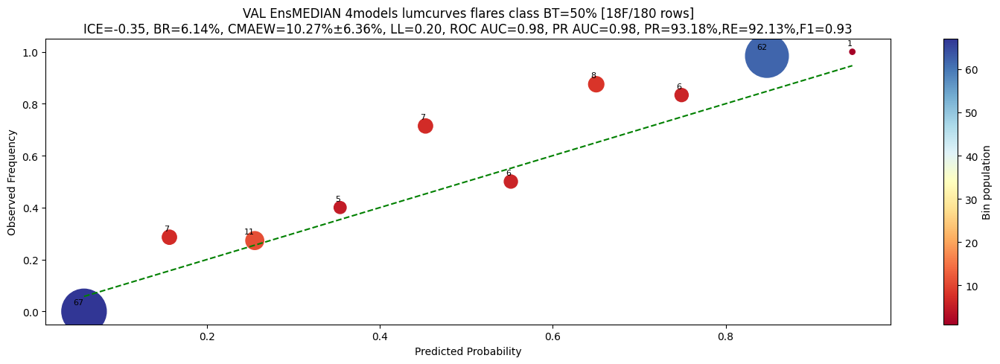

VAL EnsMEDIAN 4models lumcurves flares class BT=50%
              precision    recall  f1-score   support

           0     0.9239    0.9341    0.9290        91
           1     0.9318    0.9213    0.9266        89

    accuracy                         0.9278       180
   macro avg     0.9279    0.9277    0.9278       180
weighted avg     0.9278    0.9278    0.9278       180

ROC AUCs: 1=0.9779
PR AUCs: 1=0.9776
CALIBRATIONs: 
	1: MAEW=10.27%, STD=6.36%, COV=90%
BRIER LOSSes: 
	1=6.1395%
LOG_LOSSes: 
	1=0.2039
ICEs: 
	1=-0.3547
TOTAL INTEGRAL ERROR: -0.3547


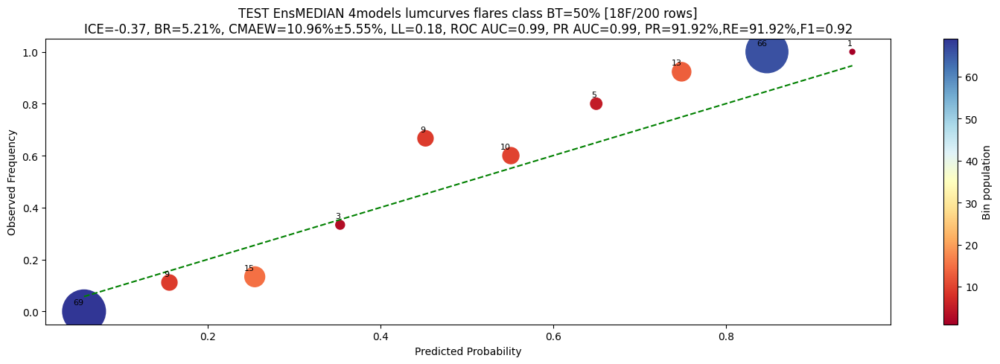

TEST EnsMEDIAN 4models lumcurves flares class BT=50%
              precision    recall  f1-score   support

           0     0.9208    0.9208    0.9208       101
           1     0.9192    0.9192    0.9192        99

    accuracy                         0.9200       200
   macro avg     0.9200    0.9200    0.9200       200
weighted avg     0.9200    0.9200    0.9200       200

ROC AUCs: 1=0.9856
PR AUCs: 1=0.9858
CALIBRATIONs: 
	1: MAEW=10.96%, STD=5.55%, COV=90%
BRIER LOSSes: 
	1=5.2059%
LOG_LOSSes: 
	1=0.1812
ICEs: 
	1=-0.3664
TOTAL INTEGRAL ERROR: -0.3664


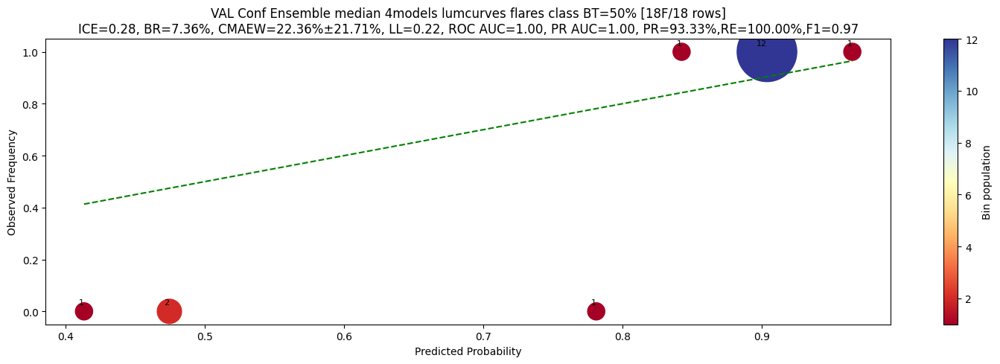

VAL Conf Ensemble median 4models lumcurves flares class BT=50%
              precision    recall  f1-score   support

           0     1.0000    0.7500    0.8571         4
           1     0.9333    1.0000    0.9655        14

    accuracy                         0.9444        18
   macro avg     0.9667    0.8750    0.9113        18
weighted avg     0.9481    0.9444    0.9414        18

ROC AUCs: 1=1.0000
PR AUCs: 1=1.0000
CALIBRATIONs: 
	1: MAEW=22.36%, STD=21.71%, COV=50%
BRIER LOSSes: 
	1=7.3618%
LOG_LOSSes: 
	1=0.2228
ICEs: 
	1=0.2843
TOTAL INTEGRAL ERROR: 0.2843


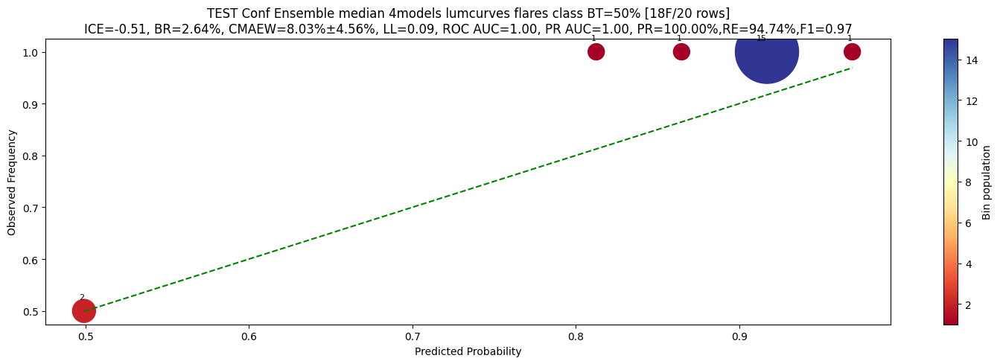

TEST Conf Ensemble median 4models lumcurves flares class BT=50%
              precision    recall  f1-score   support

           0     0.5000    1.0000    0.6667         1
           1     1.0000    0.9474    0.9730        19

    accuracy                         0.9500        20
   macro avg     0.7500    0.9737    0.8198        20
weighted avg     0.9750    0.9500    0.9577        20

ROC AUCs: 1=1.0000
PR AUCs: 1=1.0000
CALIBRATIONs: 
	1: MAEW=8.03%, STD=4.56%, COV=40%
BRIER LOSSes: 
	1=2.6354%
LOG_LOSSes: 
	1=0.0947
ICEs: 
	1=-0.5074
TOTAL INTEGRAL ERROR: -0.5074
ens member 0 excluded due to high distance from the median, mae=0.045105, std=0.063472
ens member 1 excluded due to high distance from the median, mae=0.044387, std=0.070961
ens member 2 excluded due to high distance from the median, mae=0.316449, std=0.153662
ens member 3 excluded due to high distance from the median, mae=0.045272, std=0.081298
ensemble_probabilistic_predictions filters too restrictive (4 vs 4), skipping

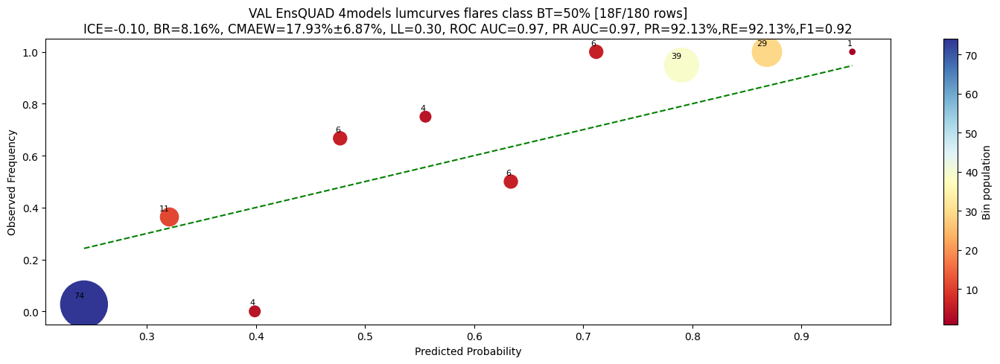

VAL EnsQUAD 4models lumcurves flares class BT=50%
              precision    recall  f1-score   support

           0     0.9043    0.9341    0.9189        91
           1     0.9302    0.8989    0.9143        89

    accuracy                         0.9167       180
   macro avg     0.9172    0.9165    0.9166       180
weighted avg     0.9171    0.9167    0.9166       180

ROC AUCs: 1=0.9747
PR AUCs: 1=0.9723
CALIBRATIONs: 
	1: MAEW=17.93%, STD=6.87%, COV=80%
BRIER LOSSes: 
	1=8.1573%
LOG_LOSSes: 
	1=0.3028
ICEs: 
	1=-0.1012
TOTAL INTEGRAL ERROR: -0.1012


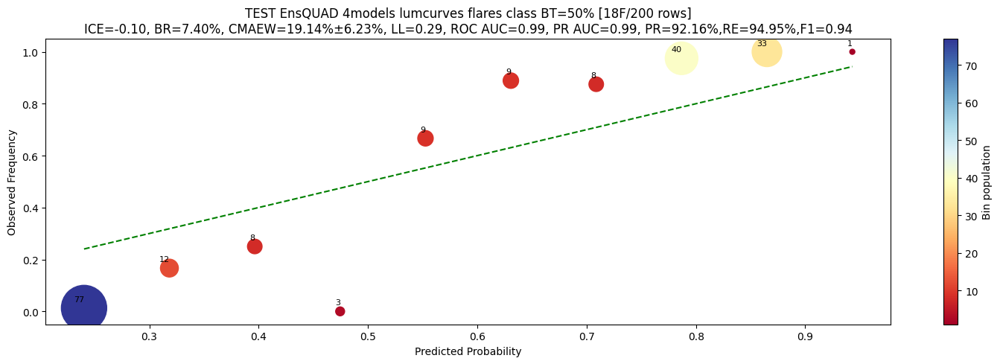

TEST EnsQUAD 4models lumcurves flares class BT=50%
              precision    recall  f1-score   support

           0     0.9394    0.9208    0.9300       101
           1     0.9208    0.9394    0.9300        99

    accuracy                         0.9300       200
   macro avg     0.9301    0.9301    0.9300       200
weighted avg     0.9302    0.9300    0.9300       200

ROC AUCs: 1=0.9851
PR AUCs: 1=0.9853
CALIBRATIONs: 
	1: MAEW=19.14%, STD=6.23%, COV=80%
BRIER LOSSes: 
	1=7.4027%
LOG_LOSSes: 
	1=0.2859
ICEs: 
	1=-0.0978
TOTAL INTEGRAL ERROR: -0.0978


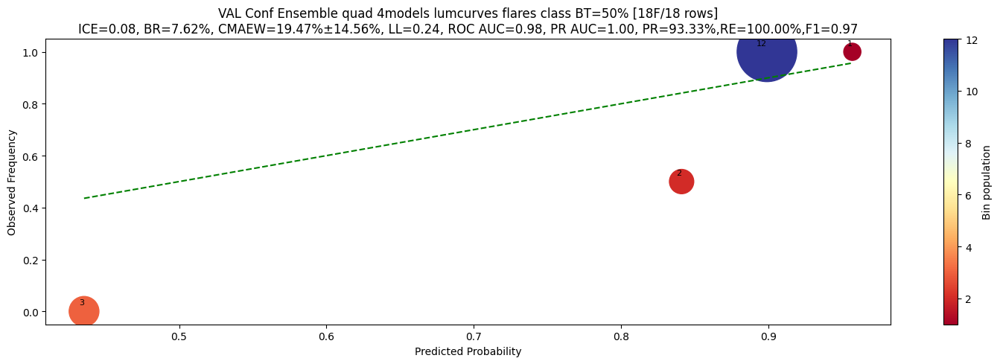

VAL Conf Ensemble quad 4models lumcurves flares class BT=50%
              precision    recall  f1-score   support

           0     1.0000    0.7500    0.8571         4
           1     0.9333    1.0000    0.9655        14

    accuracy                         0.9444        18
   macro avg     0.9667    0.8750    0.9113        18
weighted avg     0.9481    0.9444    0.9414        18

ROC AUCs: 1=0.9821
PR AUCs: 1=0.9952
CALIBRATIONs: 
	1: MAEW=19.47%, STD=14.56%, COV=40%
BRIER LOSSes: 
	1=7.6243%
LOG_LOSSes: 
	1=0.2387
ICEs: 
	1=0.0829
TOTAL INTEGRAL ERROR: 0.0829


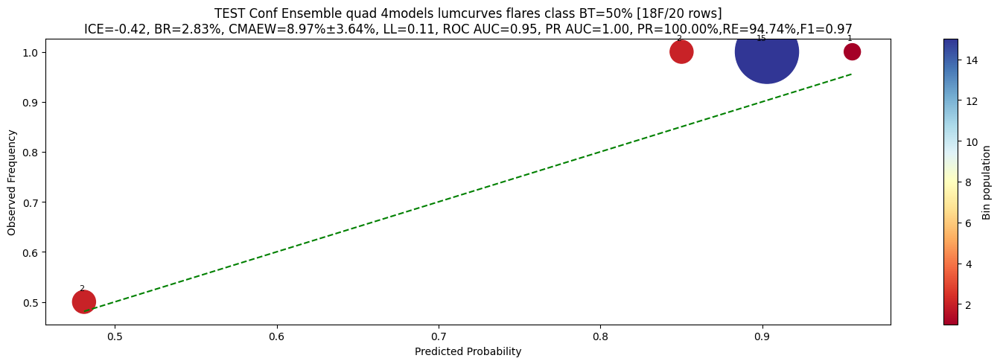

TEST Conf Ensemble quad 4models lumcurves flares class BT=50%
              precision    recall  f1-score   support

           0     0.5000    1.0000    0.6667         1
           1     1.0000    0.9474    0.9730        19

    accuracy                         0.9500        20
   macro avg     0.7500    0.9737    0.8198        20
weighted avg     0.9750    0.9500    0.9577        20

ROC AUCs: 1=0.9474
PR AUCs: 1=0.9974
CALIBRATIONs: 
	1: MAEW=8.97%, STD=3.64%, COV=30%
BRIER LOSSes: 
	1=2.8327%
LOG_LOSSes: 
	1=0.1134
ICEs: 
	1=-0.4175
TOTAL INTEGRAL ERROR: -0.4175
ens member 0 excluded due to high distance from the median, mae=0.045105, std=0.063472
ens member 1 excluded due to high distance from the median, mae=0.044387, std=0.070961
ens member 2 excluded due to high distance from the median, mae=0.316449, std=0.153662
ens member 3 excluded due to high distance from the median, mae=0.045272, std=0.081298
ensemble_probabilistic_predictions filters too restrictive (4 vs 4), skipping t

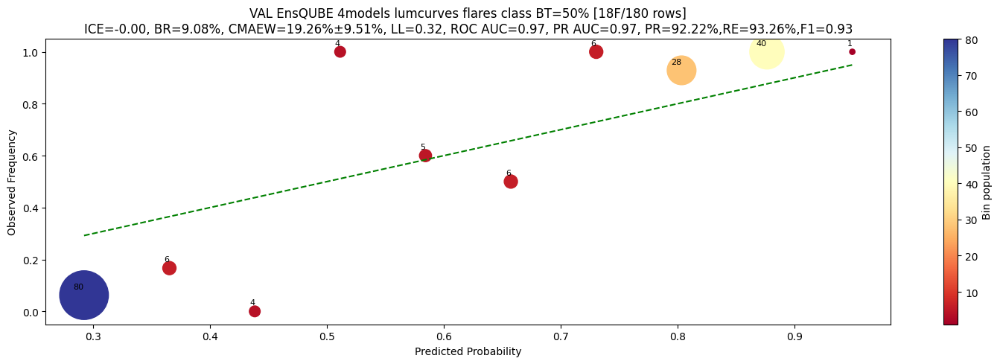

VAL EnsQUBE 4models lumcurves flares class BT=50%
              precision    recall  f1-score   support

           0     0.9043    0.9341    0.9189        91
           1     0.9302    0.8989    0.9143        89

    accuracy                         0.9167       180
   macro avg     0.9172    0.9165    0.9166       180
weighted avg     0.9171    0.9167    0.9166       180

ROC AUCs: 1=0.9738
PR AUCs: 1=0.9740
CALIBRATIONs: 
	1: MAEW=19.26%, STD=9.51%, COV=70%
BRIER LOSSes: 
	1=9.0808%
LOG_LOSSes: 
	1=0.3248
ICEs: 
	1=-0.0037
TOTAL INTEGRAL ERROR: -0.0037


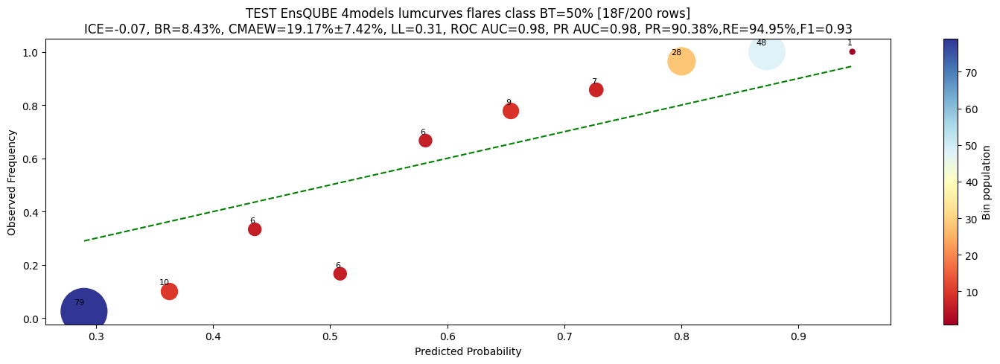

TEST EnsQUBE 4models lumcurves flares class BT=50%
              precision    recall  f1-score   support

           0     0.9490    0.9208    0.9347       101
           1     0.9216    0.9495    0.9353        99

    accuracy                         0.9350       200
   macro avg     0.9353    0.9351    0.9350       200
weighted avg     0.9354    0.9350    0.9350       200

ROC AUCs: 1=0.9838
PR AUCs: 1=0.9845
CALIBRATIONs: 
	1: MAEW=19.17%, STD=7.42%, COV=70%
BRIER LOSSes: 
	1=8.4327%
LOG_LOSSes: 
	1=0.3100
ICEs: 
	1=-0.0670
TOTAL INTEGRAL ERROR: -0.0670


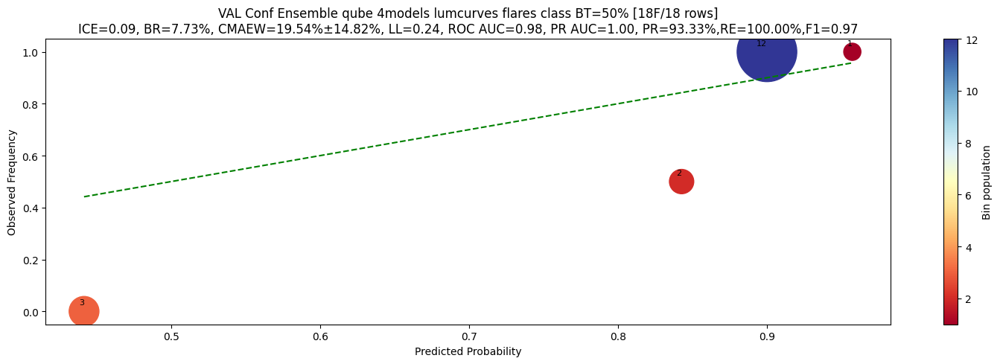

VAL Conf Ensemble qube 4models lumcurves flares class BT=50%
              precision    recall  f1-score   support

           0     1.0000    0.7500    0.8571         4
           1     0.9333    1.0000    0.9655        14

    accuracy                         0.9444        18
   macro avg     0.9667    0.8750    0.9113        18
weighted avg     0.9481    0.9444    0.9414        18

ROC AUCs: 1=0.9821
PR AUCs: 1=0.9952
CALIBRATIONs: 
	1: MAEW=19.54%, STD=14.82%, COV=40%
BRIER LOSSes: 
	1=7.7286%
LOG_LOSSes: 
	1=0.2411
ICEs: 
	1=0.0908
TOTAL INTEGRAL ERROR: 0.0908


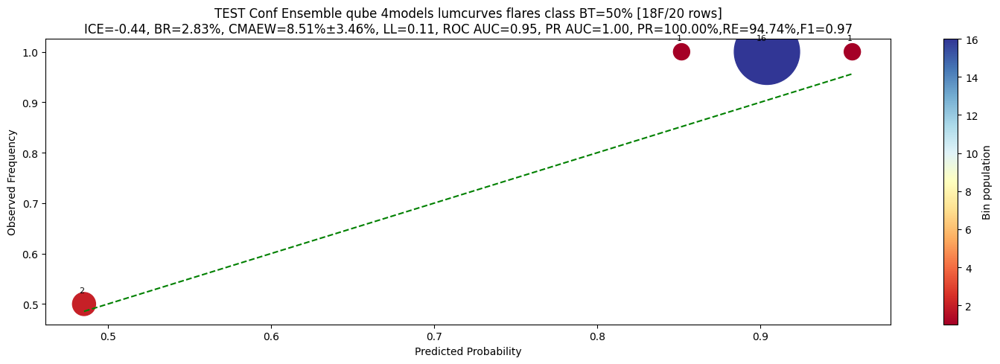

TEST Conf Ensemble qube 4models lumcurves flares class BT=50%
              precision    recall  f1-score   support

           0     0.5000    1.0000    0.6667         1
           1     1.0000    0.9474    0.9730        19

    accuracy                         0.9500        20
   macro avg     0.7500    0.9737    0.8198        20
weighted avg     0.9750    0.9500    0.9577        20

ROC AUCs: 1=0.9474
PR AUCs: 1=0.9974
CALIBRATIONs: 
	1: MAEW=8.51%, STD=3.46%, COV=30%
BRIER LOSSes: 
	1=2.8259%
LOG_LOSSes: 
	1=0.1123
ICEs: 
	1=-0.4351
TOTAL INTEGRAL ERROR: -0.4351
ens member 0 excluded due to high distance from the median, mae=0.045105, std=0.063472
ens member 1 excluded due to high distance from the median, mae=0.044387, std=0.070961
ens member 2 excluded due to high distance from the median, mae=0.316449, std=0.153662
ens member 3 excluded due to high distance from the median, mae=0.045272, std=0.081298
ensemble_probabilistic_predictions filters too restrictive (4 vs 4), skipping t

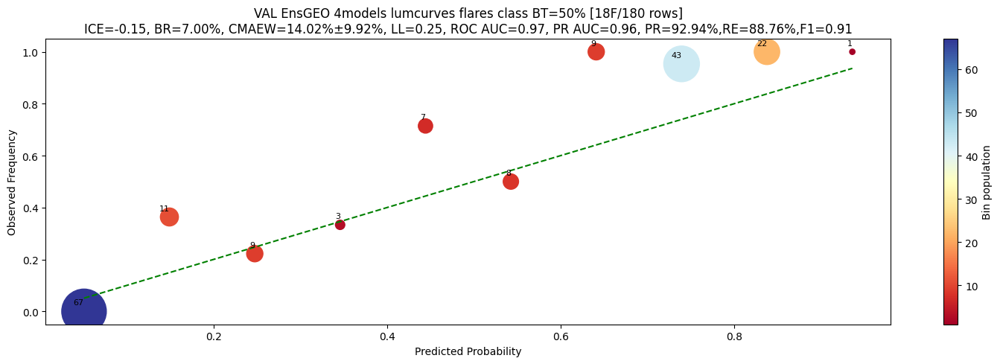

VAL EnsGEO 4models lumcurves flares class BT=50%
              precision    recall  f1-score   support

           0     0.9043    0.9341    0.9189        91
           1     0.9302    0.8989    0.9143        89

    accuracy                         0.9167       180
   macro avg     0.9172    0.9165    0.9166       180
weighted avg     0.9171    0.9167    0.9166       180

ROC AUCs: 1=0.9696
PR AUCs: 1=0.9615
CALIBRATIONs: 
	1: MAEW=14.02%, STD=9.92%, COV=90%
BRIER LOSSes: 
	1=7.0047%
LOG_LOSSes: 
	1=0.2478
ICEs: 
	1=-0.1536
TOTAL INTEGRAL ERROR: -0.1536


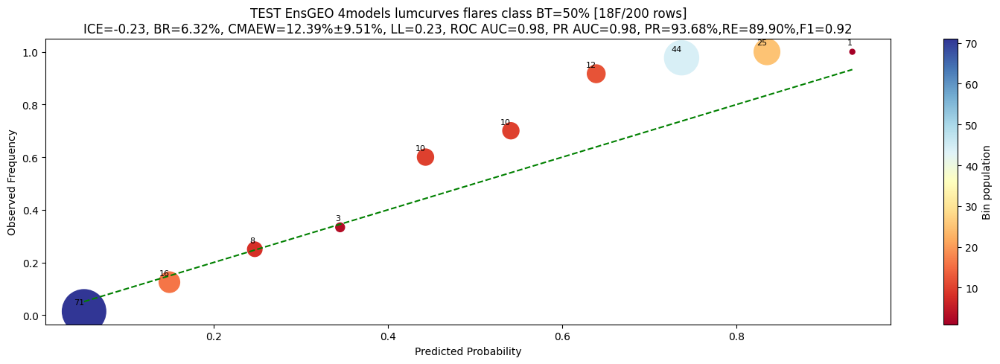

TEST EnsGEO 4models lumcurves flares class BT=50%
              precision    recall  f1-score   support

           0     0.9394    0.9208    0.9300       101
           1     0.9208    0.9394    0.9300        99

    accuracy                         0.9300       200
   macro avg     0.9301    0.9301    0.9300       200
weighted avg     0.9302    0.9300    0.9300       200

ROC AUCs: 1=0.9797
PR AUCs: 1=0.9799
CALIBRATIONs: 
	1: MAEW=12.39%, STD=9.51%, COV=90%
BRIER LOSSes: 
	1=6.3172%
LOG_LOSSes: 
	1=0.2334
ICEs: 
	1=-0.2303
TOTAL INTEGRAL ERROR: -0.2303


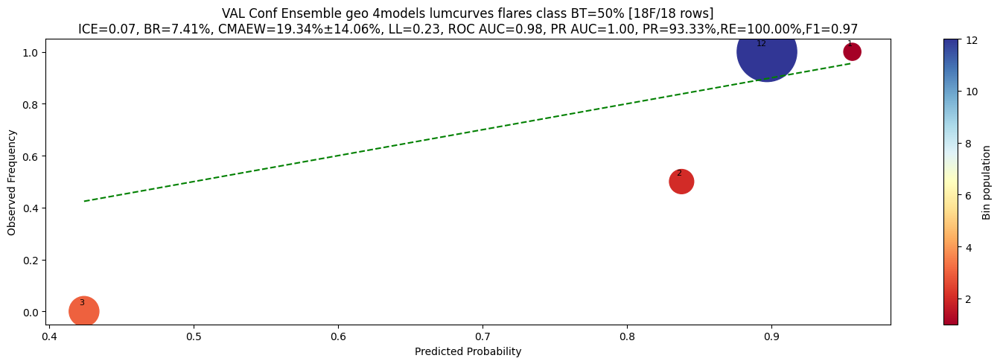

VAL Conf Ensemble geo 4models lumcurves flares class BT=50%
              precision    recall  f1-score   support

           0     1.0000    0.7500    0.8571         4
           1     0.9333    1.0000    0.9655        14

    accuracy                         0.9444        18
   macro avg     0.9667    0.8750    0.9113        18
weighted avg     0.9481    0.9444    0.9414        18

ROC AUCs: 1=0.9821
PR AUCs: 1=0.9952
CALIBRATIONs: 
	1: MAEW=19.34%, STD=14.06%, COV=40%
BRIER LOSSes: 
	1=7.4142%
LOG_LOSSes: 
	1=0.2341
ICEs: 
	1=0.0681
TOTAL INTEGRAL ERROR: 0.0681


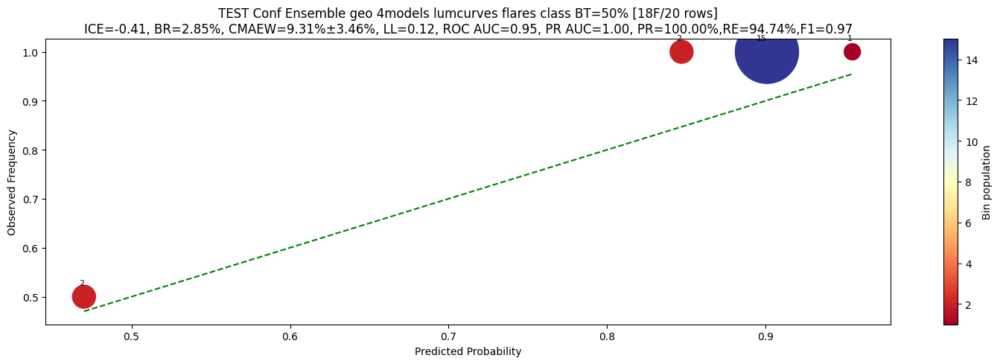

TEST Conf Ensemble geo 4models lumcurves flares class BT=50%
              precision    recall  f1-score   support

           0     0.5000    1.0000    0.6667         1
           1     1.0000    0.9474    0.9730        19

    accuracy                         0.9500        20
   macro avg     0.7500    0.9737    0.8198        20
weighted avg     0.9750    0.9500    0.9577        20

ROC AUCs: 1=0.9474
PR AUCs: 1=0.9974
CALIBRATIONs: 
	1: MAEW=9.31%, STD=3.46%, COV=40%
BRIER LOSSes: 
	1=2.8539%
LOG_LOSSes: 
	1=0.1158
ICEs: 
	1=-0.4108
TOTAL INTEGRAL ERROR: -0.4108
time: 1min 43s (started: 2025-12-17 04:48:46 +03:00)


In [45]:
target_name = "lumcurves"

models, metadata = train_mlframe_models_suite(
    df=features,
    target_name=target_name,
    model_name=f"flares",
    features_and_targets_extractor=ft_extractor,
    # mlframe_models="mlp cb".split(),
    init_common_params={"show_perf_chart": True, "show_fi": True},
    use_ordinary_models=True,
    split_config=TrainingSplitConfig(shuffle_val=True, shuffle_test=True),
    use_mlframe_ensembles=True,
    data_dir="data",
    models_dir=None,
    verbose=True,
)

In [57]:
view_series(df, i=13)

time: 313 ms (started: 2025-12-17 10:11:06 +03:00)
